In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from matplotlib import patches as patch
import matplotlib.animation as anim
from IPython.display import HTML
from skimage import measure
import time

In [4]:
ball = cv2.imread("ball.jpg")

In [10]:
def Non_Parametric_Segmentation(img,ROI,BINS):
#     r = cv2.selectROI(img)
#     ROI = img[int(r[1]):int(r[1]+r[3]), int(r[0]):int(r[0]+r[2])]

    img = img/255
    ROI = ROI/255

    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]

    I = R+G+B

    I[I==0] = 10

    r = R/I
    g = G/I

    ROI_R = ROI[:,:,0]
    ROI_G = ROI[:,:,1]
    ROI_B = ROI[:,:,2]

    ROI_I = ROI_R+ROI_G+ROI_B
    ROI_r = ROI_R/ROI_I
    ROI_g = ROI_G/ROI_I

    r_roi_int = (ROI_r*(BINS-1)).astype(int)
    g_roi_int = (ROI_g*(BINS-1)).astype(int)
    
    matrix, xbin, ybin = np.histogram2d(g_roi_int.flatten(), r_roi_int.flatten(), bins = BINS, range = [[0,BINS],[0,BINS]])
    r_int, g_int = (r*(BINS-1)).astype(int), (g*(BINS-1)).astype(int)
    
    back_projection = np.zeros(r.shape)
    for i in range(r.shape[0]):
        for j in range(r.shape[1]):
            back_projection[i,j] = matrix[g_int[i,j], r_int[i,j]]
    
    return back_projection

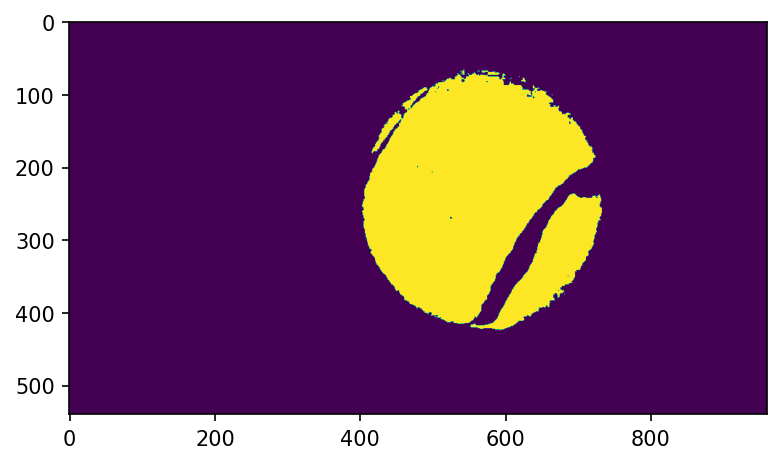

In [7]:
Segmented = Non_Parametric_Segmentation(ball,15,BINS=15)
plt.figure(dpi = 150)
plt.imshow(Segmented)

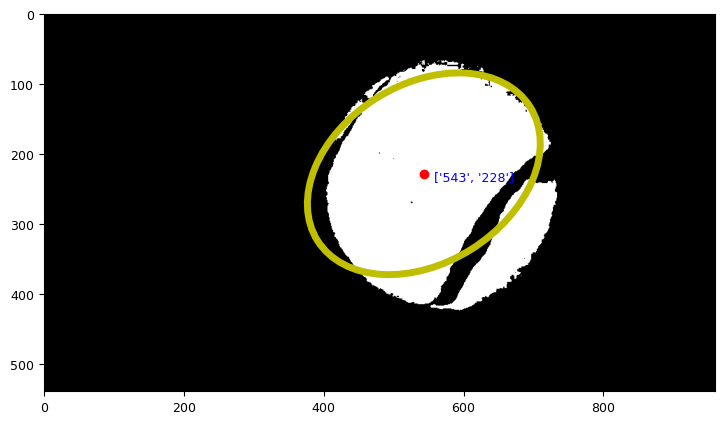

In [8]:
fig = plt.figure(figsize = [10,5], dpi = 100, facecolor = 'w')
plt.rcParams.update({'font.size' : 9})
plt.rcParams['axes.titlesize'] = 15
ax1 = fig.add_subplot(111)

A = measure.label(Segmented, connectivity=2)

CX = []
CY = []
AREA = []

for region in measure.regionprops(A):
    if 100000 > region.area > 50000:
        y, x = region.centroid
        CX.append(x)
        CY.append(y)
        
        AREA.append(region.area)
        ax1.imshow(Segmented, cmap = 'gray')
        ax1.plot(x,y, 'ro')  
        major, minor = region.major_axis_length, region.minor_axis_length
       
        th = np.degrees(region.orientation)
        ellipse = patch.Ellipse((x, y), major, minor, th,
                             fill=False, ec='y', lw=5)
        ax1.add_patch(ellipse)
        ax1.text(x+15,y+10,[str(int(x)),str(int(y))], color = "b")


In [6]:
# import cv2
# vidcap = cv2.VideoCapture('ball_drop.mp4')
# success,image = vidcap.read()
# count = 0
# success = True
# while success:
#     success,image = vidcap.read()
#     cv2.imwrite("frames/frame%d.jpg" % count, image)     # save frame as JPEG file
#     if cv2.waitKey(10) == 27:                     # exit if Escape is hit
#         break
#     count += 1

C:\Users\renep\AppData\Local\Temp/ipykernel_8036/2963555351.py:7: RuntimeWarning: invalid value encountered in true_divide
  Segmented = Segmented/Segmented.max()


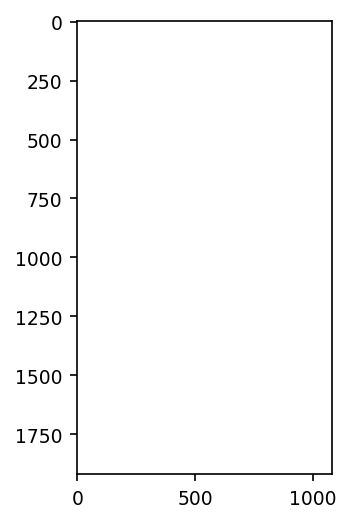

In [14]:
i = 91
img = cv2.imread("frames/frame"+str(i)+".jpg")
r = cv2.selectROI(img)
ROI = img[int(r[1]):int(r[1]+r[3]), int(r[0]):int(r[0]+r[2])]

Segmented = Non_Parametric_Segmentation(img, ROI,25)
Segmented = Segmented/Segmented.max()
plt.figure(dpi = 150)
plt.imshow(Segmented)

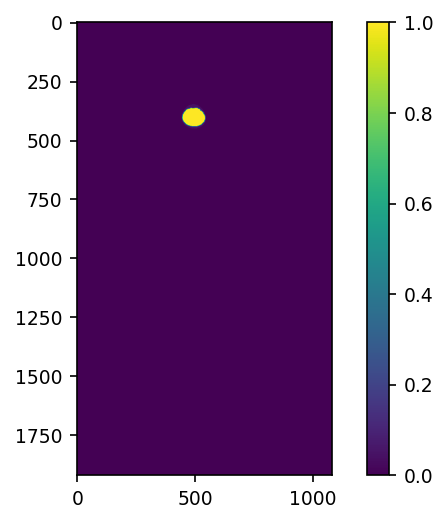

In [11]:
plt.figure(dpi = 150)
Segmented[Segmented>0.3] = 1
plt.imshow(Segmented)
plt.colorbar()

C:\Users\renep\AppData\Local\Temp/ipykernel_8036/2227228861.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = [10,8], dpi = 100, facecolor = 'w')


TypeError: unsupported operand type(s) for /: 'NoneType' and 'int'

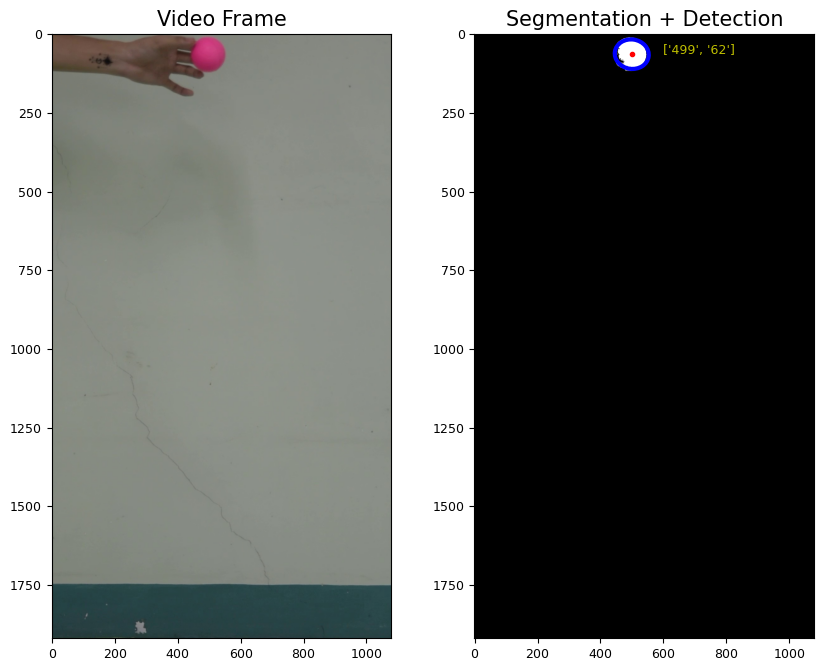

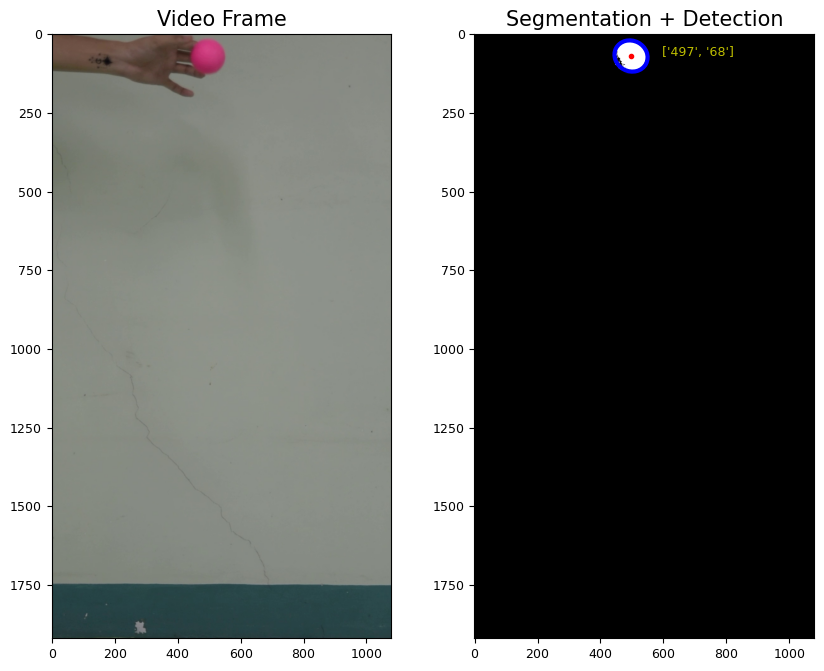

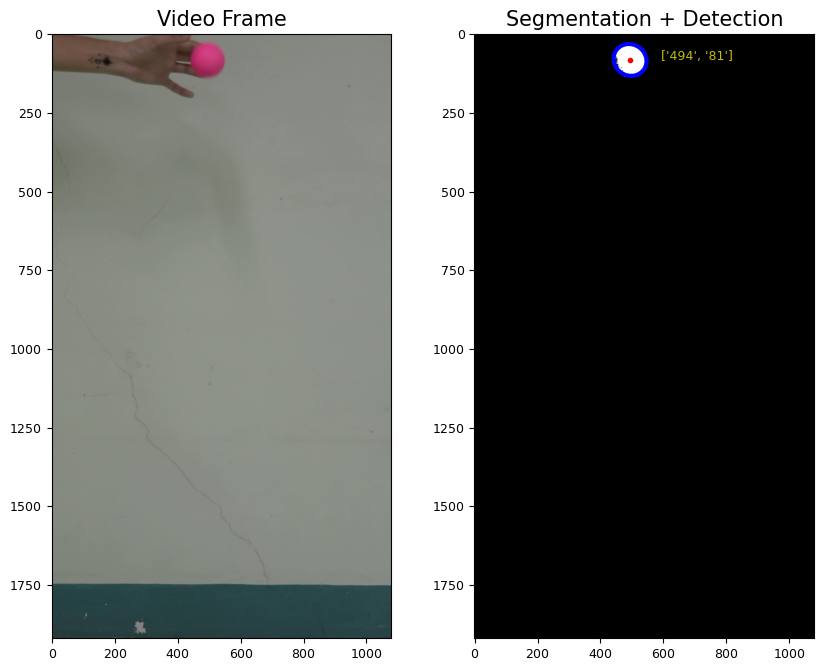

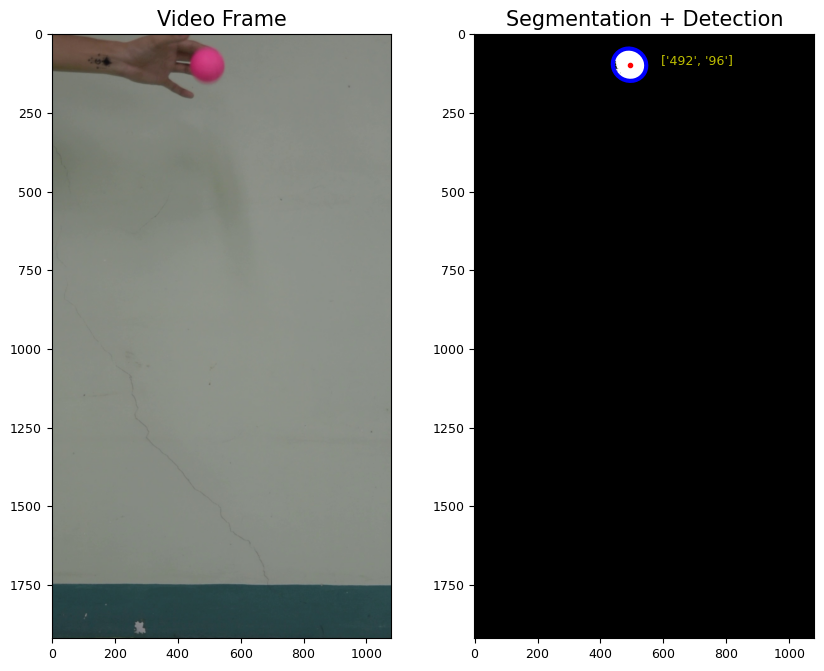

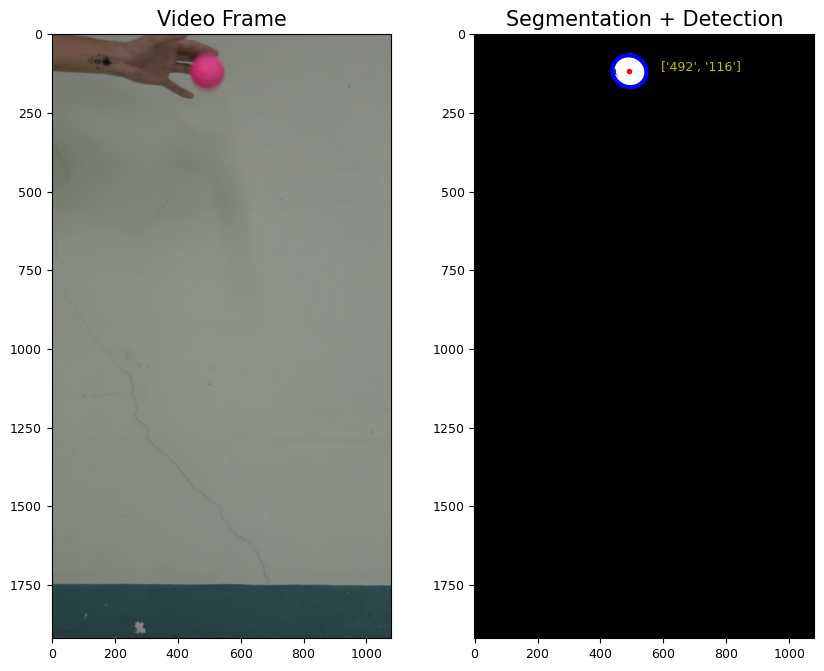

...

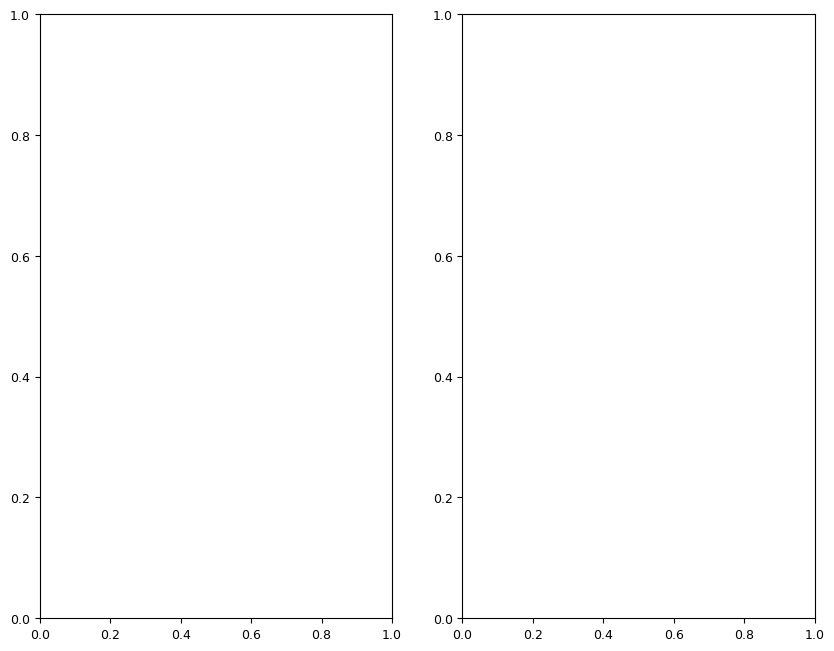

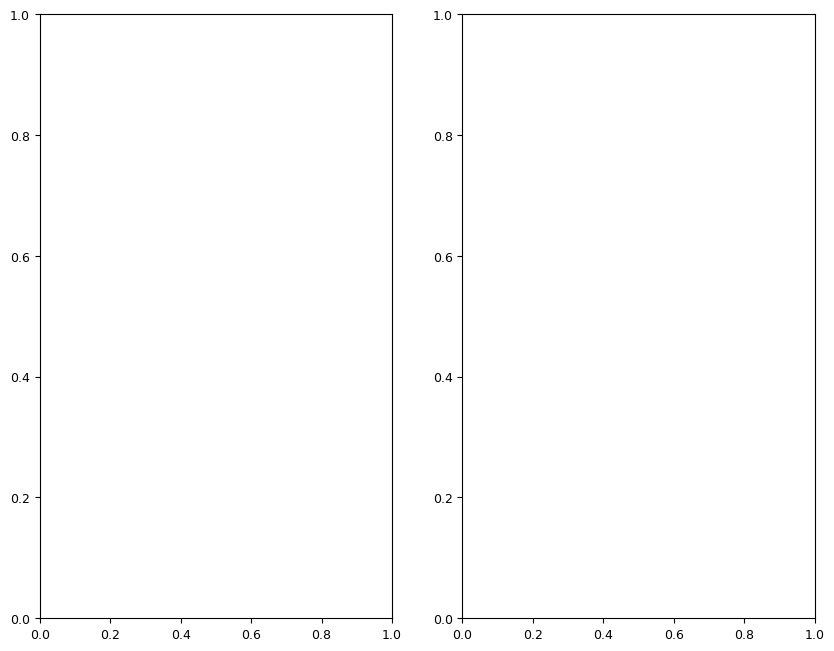

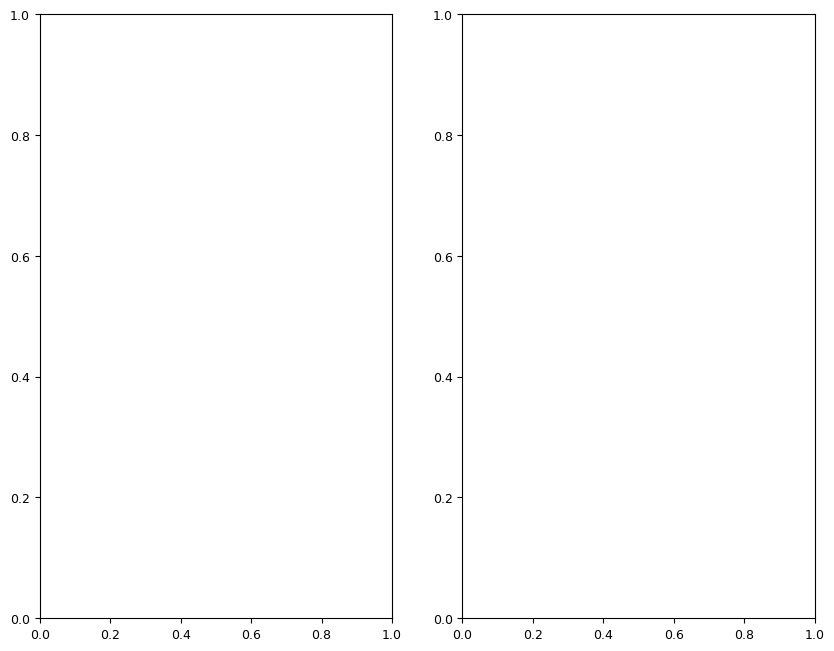

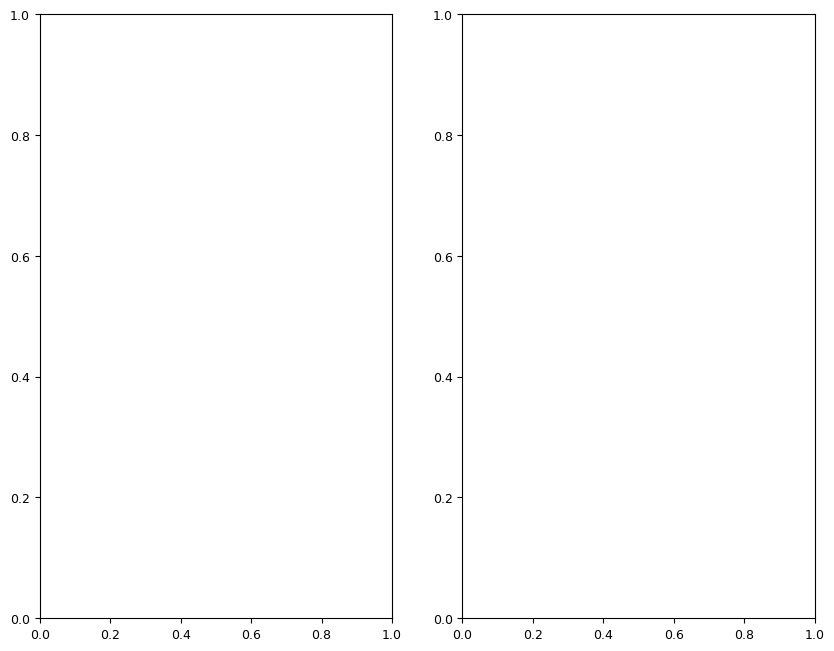

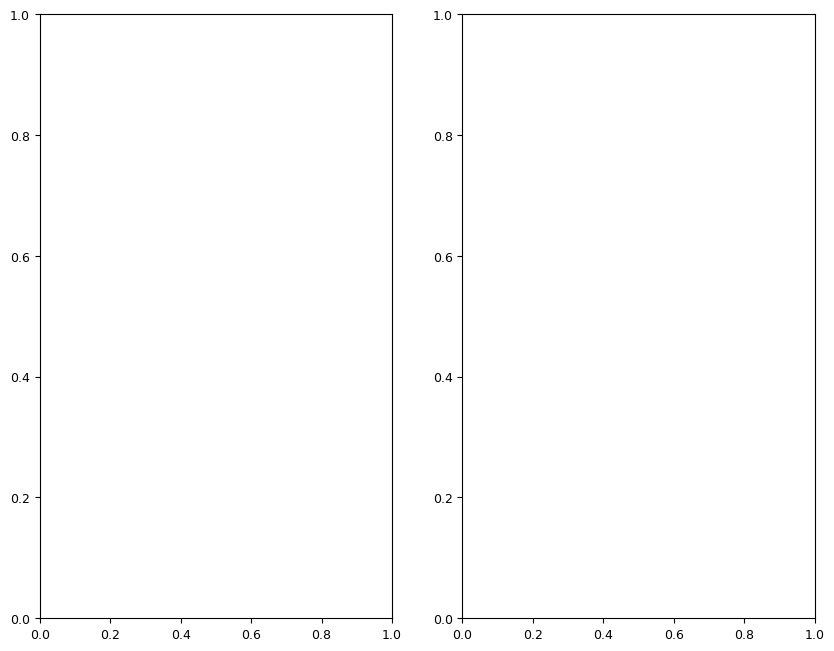

In [12]:
CX = []
CY = []
MAJOR = []
MINOR = []
counts = 119

for i in range(counts):
    fig = plt.figure(figsize = [10,8], dpi = 100, facecolor = 'w')
    plt.rcParams.update({'font.size' : 9})
    plt.rcParams['axes.titlesize'] = 15
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)

    img = cv2.imread("frames/frame"+str(i)+".jpg")
    Segmented = Non_Parametric_Segmentation(img, ROI,25)
    Segmented = Segmented/Segmented.max()
    Segmented[Segmented>0.3] = 1
    A = measure.label(Segmented, connectivity=2)
    
    for region in measure.regionprops(A):
        if region.area > 500:
            y, x = region.centroid
            CX.append(x)
            CY.append(y)
            ax1.set_title("Video Frame")
            ax1.imshow(img[:,:,::-1])
            ax2.set_title("Segmentation + Detection")
            ax2.imshow(Segmented, cmap = 'gray')
            ax2.plot(x,y, 'r.')  
            major, minor = region.major_axis_length, region.minor_axis_length
            MAJOR.append(major)
            MINOR.append(minor)
            th = np.degrees(region.orientation)
            ellipse = patch.Ellipse((x, y), major, minor, th,
                                 fill=False, ec='b', lw=3)
            ax2.add_patch(ellipse)
            ax2.text(x+100,y+0,[str(int(x)),str(int(y))], color = "y")
            a
            plt.savefig("segmented/frame" + str(i) +".jpg")
    

Text(0.5, 0, 'time, s')

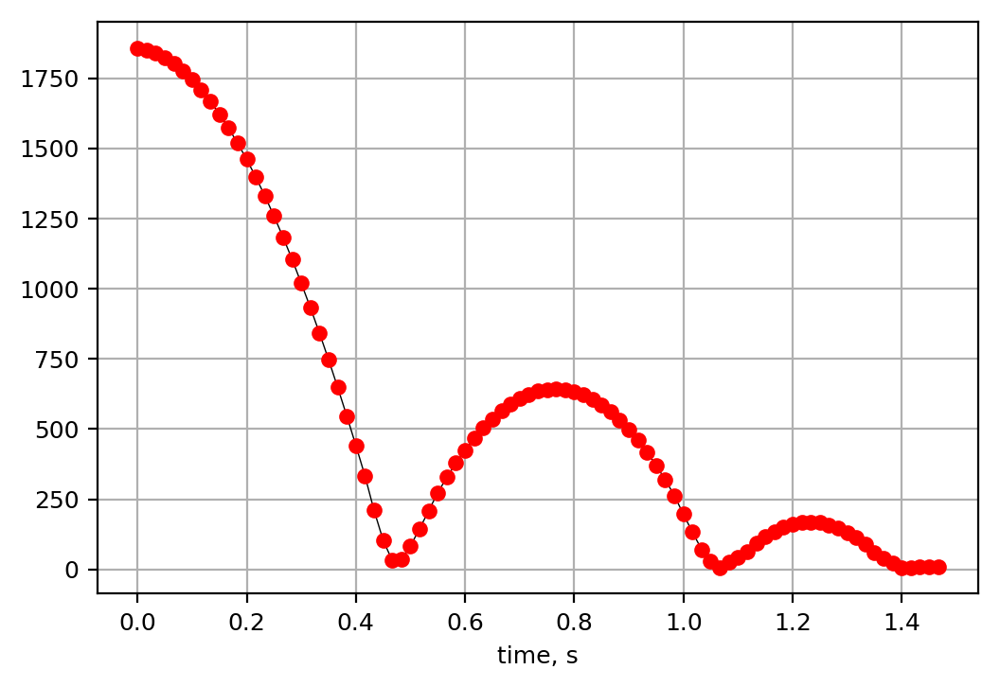

In [121]:
plt.figure(dpi = 200, facecolor = 'w')
fps = 60
duration = len(CY)/fps
t = np.arange(0, duration-1/fps, 1/fps)
plt.plot(t, -np.array(CY[:-1])+ 1920, 'k-', lw = 0.5)
plt.plot(t, -np.array(CY[:-1])+ 1920, 'ro', ms = 5)
plt.grid()
plt.xlabel("time, s")

In [126]:
np.mean(MAJOR[:25])


104.65549301533405

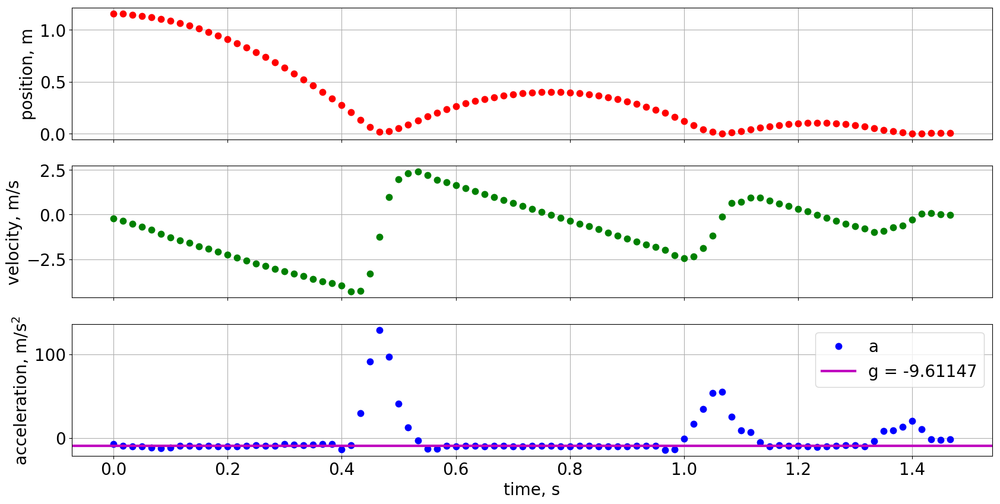

In [144]:
plt.figure(figsize=[20,10], dpi = 100, facecolor = 'w')
plt.rcParams.update({'font.size' : 20})
plt.rcParams['axes.titlesize'] = 15
fps = 60
duration = len(CY)/fps
t = np.arange(0, duration-1/fps, 1/fps)
y = (-np.array(CY[:-1])+ 1920)*0.065/104.65

dt = t[1]-t[0]
dtdy = np.gradient(y, dt)

dt2d2y = np.gradient(dtdy, dt)


ax1 = plt.subplot(3,1,1)
plt.plot(t, y, 'r.', ms = 15)
plt.grid()
plt.ylabel("position, m")
plt.setp(ax1.get_xticklabels(), visible=False)


ax2 = plt.subplot(3,1,2)
plt.plot(t, dtdy, 'g.', ms = 15)
plt.grid()
plt.ylabel("velocity, m/s")
plt.setp(ax2.get_xticklabels(), visible=False)


ax3 = plt.subplot(3,1,3)

g = np.mean(dt2d2y[:25])
plt.plot(t, dt2d2y, 'b.', ms = 15)
plt.grid()
plt.ylabel("acceleration, m/s$^2$")
plt.xlabel("time, s")
plt.axhline(g, color = 'm', lw = 3)
plt.legend(["a", "g = " + str(np.round(g,5))])
plt.show()

In [84]:
dt = t[1]-t[0]

550 pixels = 0.065 m

In [86]:
dtdx = np.gradient(y, dt)

In [132]:
np.mean(dt2d2y[:25])

-9.611474609871678

In [128]:
0.065/104.65

0.0006211180124223603

In [113]:
Segmented.shape

(1920, 1080)